In [1]:
# imports
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import math
import time
from shapely.geometry import Polygon
import shapely.ops as so
import shapely
from matplotlib.backends.backend_pdf import PdfPages

In [3]:
# INPUT DATA (change this only to test automation)
# merger probabilities
signal_name = "GW190426"
candidate_p_bns = 0.15
candidate_p_bhns = 0.60
candidate_p_gap = 0.25
candidate_p_bbh = 0.00
candidate_p_ns = 0.01

# importing data generated from mass constraints through link to csv file
url = 'https://raw.githubusercontent.com/laffytaffyz/summer-mini-project-2023/main/eta%20constraints%20testing%20data/output_log_constraints1.csv'
# constraint_n = int(url[-5])
# ns_mass_limit = 3 if (constraint_n == 1 or constraint_n == 2 or constraint_n == 3 or constraint_n == 4) else 2.25
# mass_outer_limit = 0 if (constraint_n == 1 or constraint_n == 3 or constraint_n == 5 or constraint_n == 6) else 1
ns_mass_limit = 3
mass_outer_limit = 0
original_df = pd.read_csv(url)
original_df.head(40)

,Unnamed: 0,mch_0,eta_0,e_eta,p_bns,p_bhns,p_gap,p_bbh,p_ns
0,0,0.5,-7.0,0.25,0.000000e+00,1.000000,0.0,0.0,1.0
1,1,0.5,-7.0,0.50,0.000000e+00,1.000000,0.0,0.0,1.0
2,2,0.5,-7.0,0.75,0.000000e+00,1.000000,0.0,0.0,1.0
3,3,0.5,-7.0,1.00,5.261006e-191,1.000000,0.0,0.0,1.0
4,4,0.5,-7.0,1.25,4.510430e-123,1.000000,0.0,0.0,1.0
5,5,0.5,-7.0,1.50,3.385608e-86,1.000000,0.0,0.0,1.0
6,6,0.5,-7.0,1.75,5.560940e-64,1.000000,0.0,0.0,1.0
7,7,0.5,-7.0,2.00,1.410356e-49,1.000000,0.0,0.0,1.0
8,8,0.5,-7.0,2.25,1.031321e-39,1.000000,0.0,0.0,1.0
9,9,0.5,-7.0,2.50,1.147978e-32,1.000000,0.0,0.0,1.0


/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
<ipython-input-12-9a1647f5cfde>:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


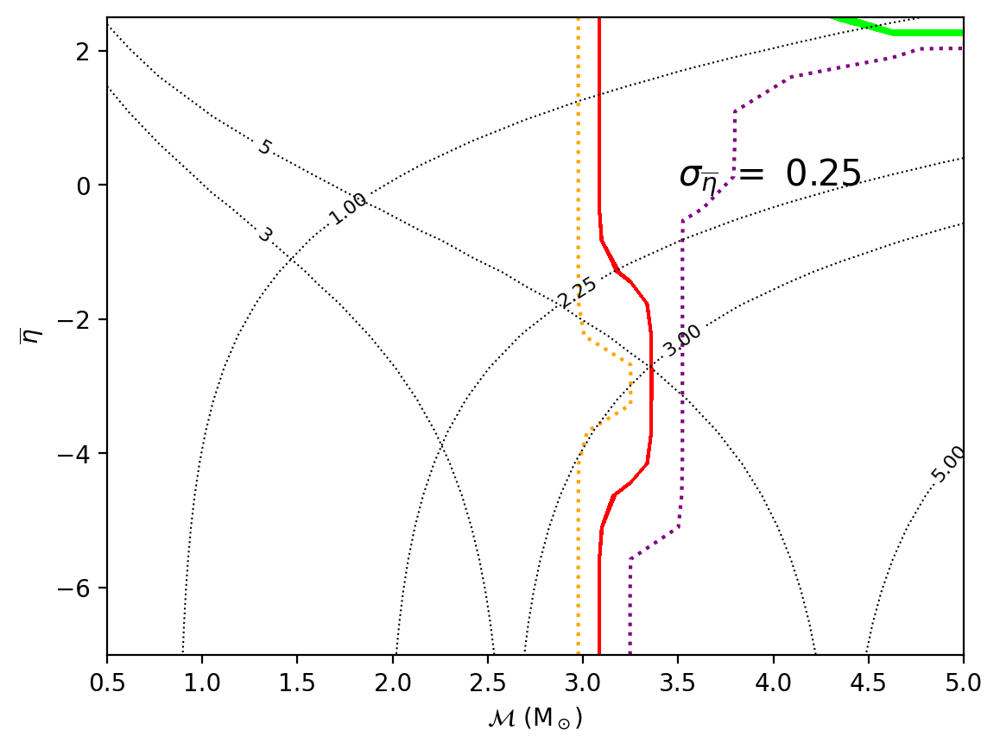

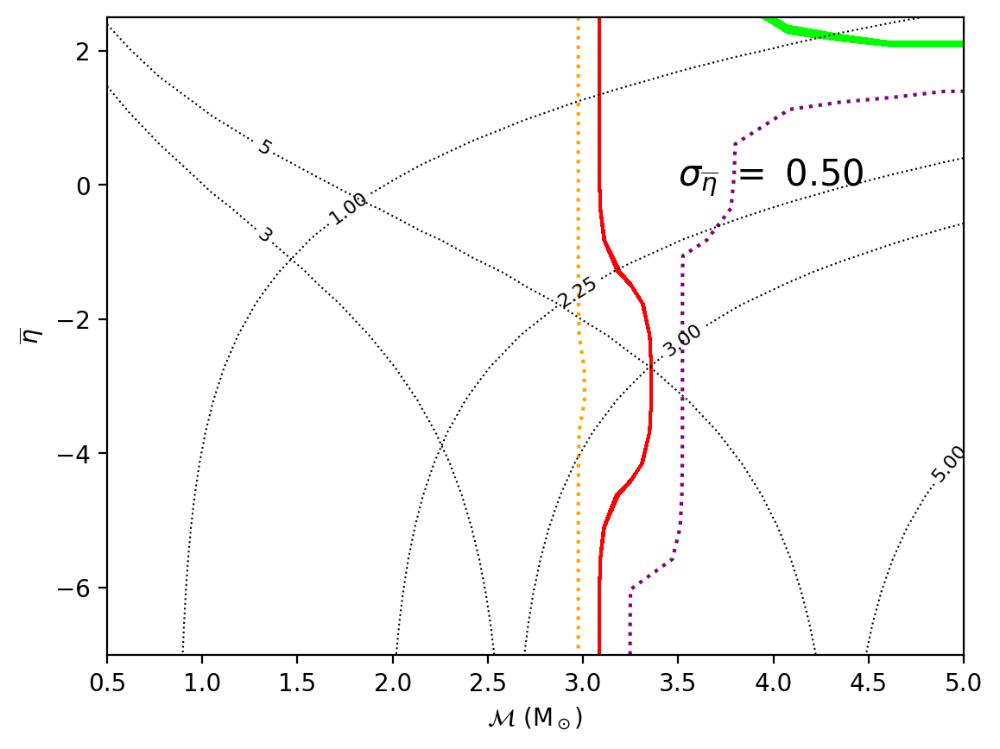

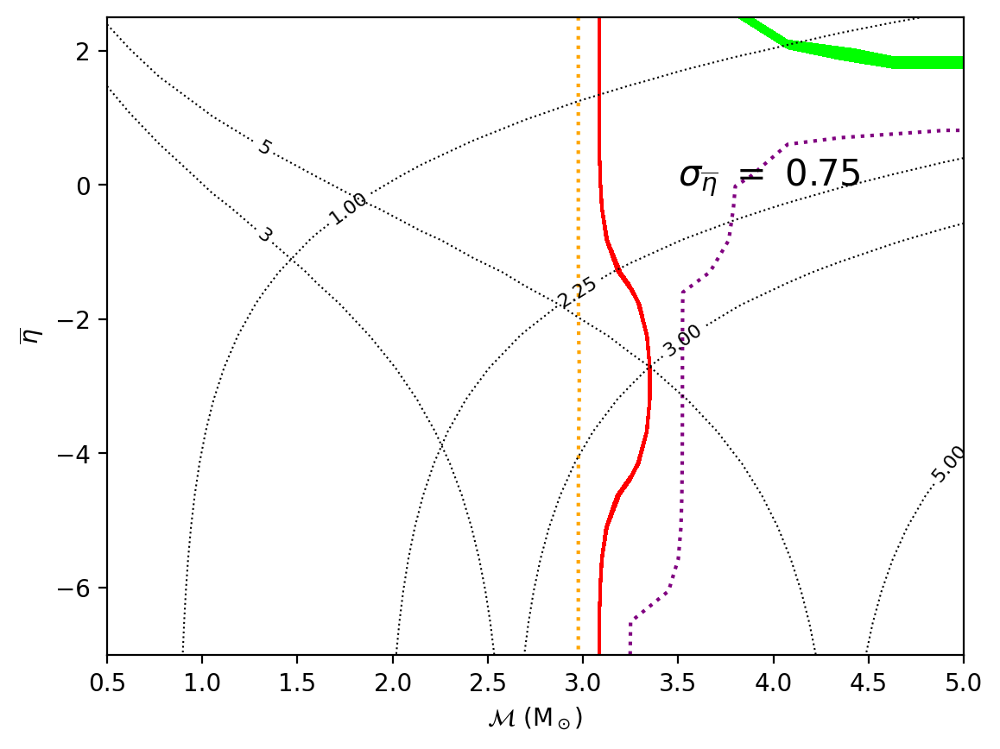

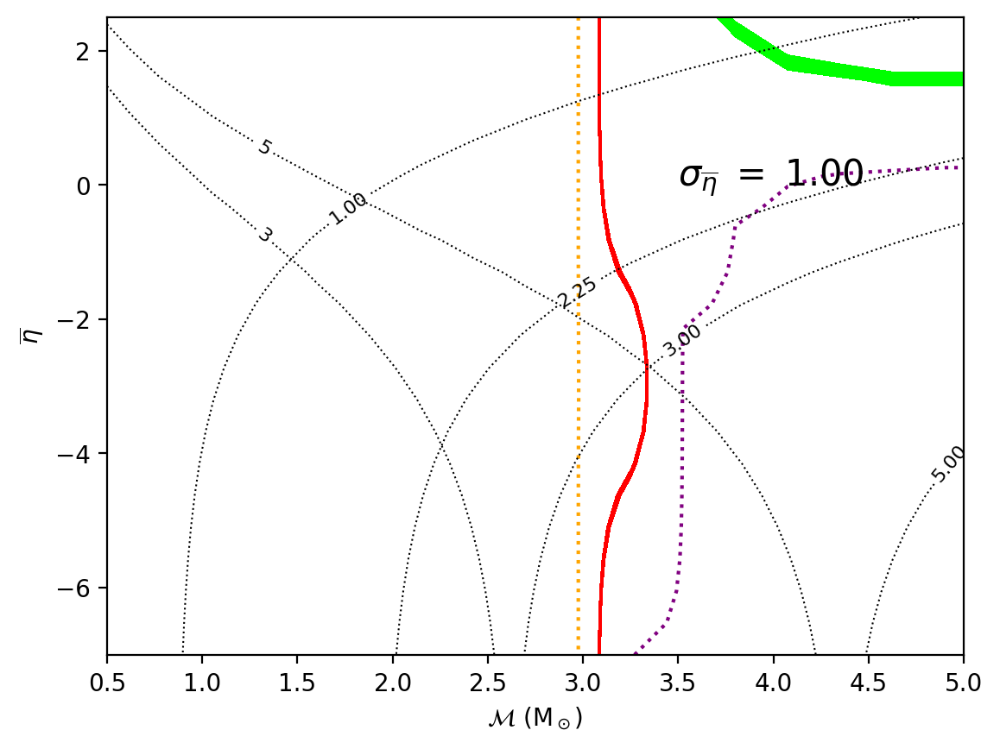

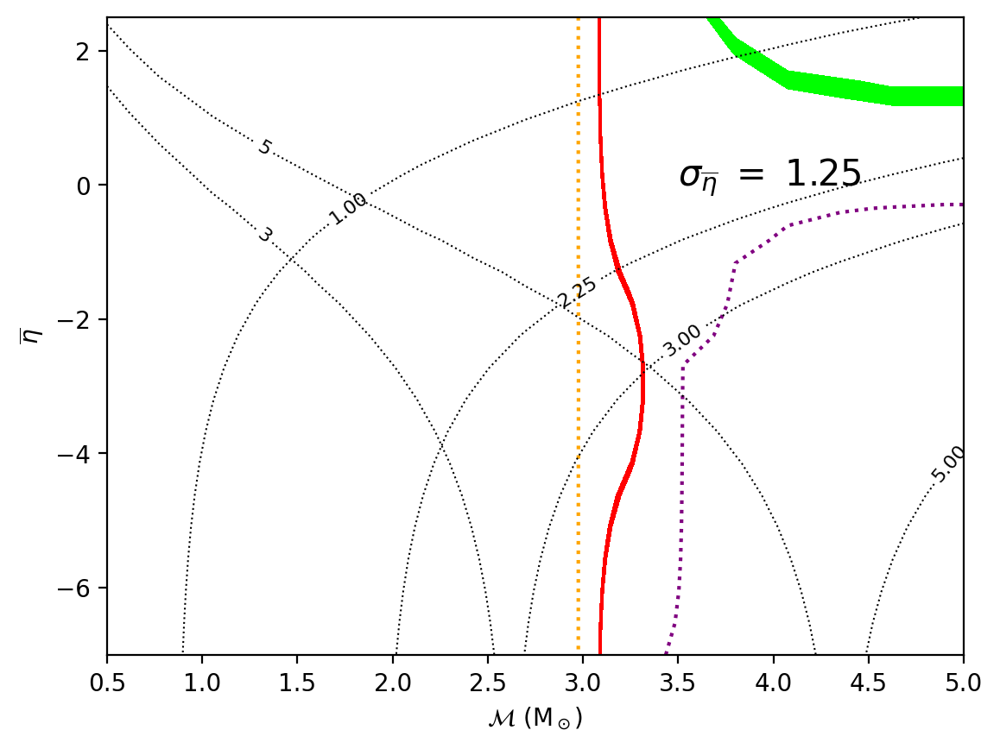

...

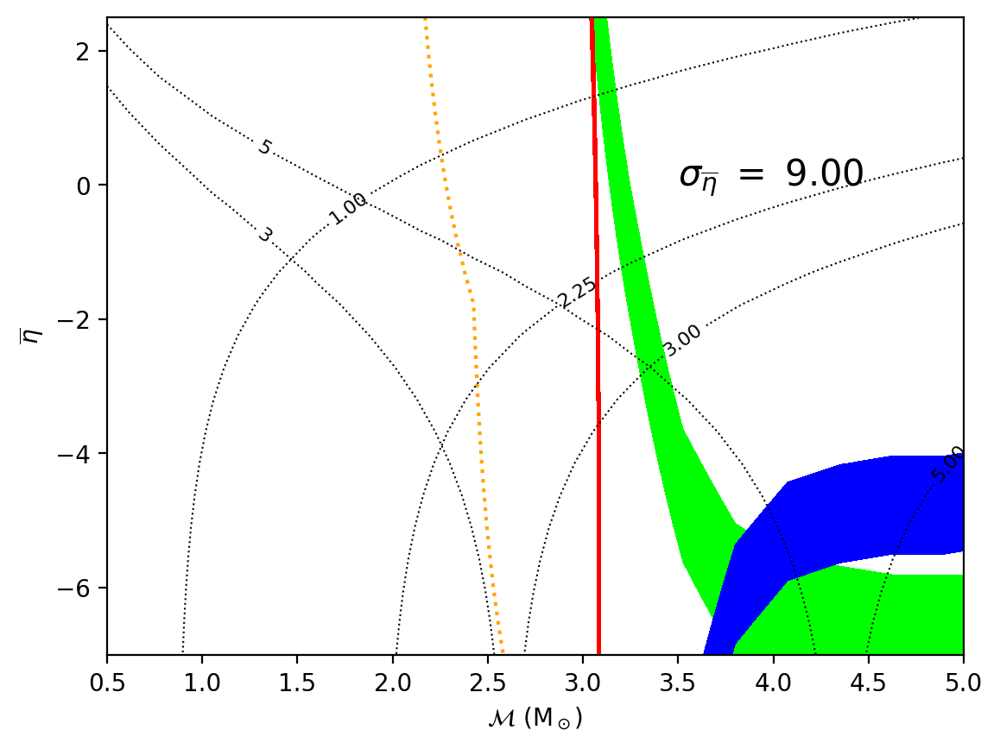

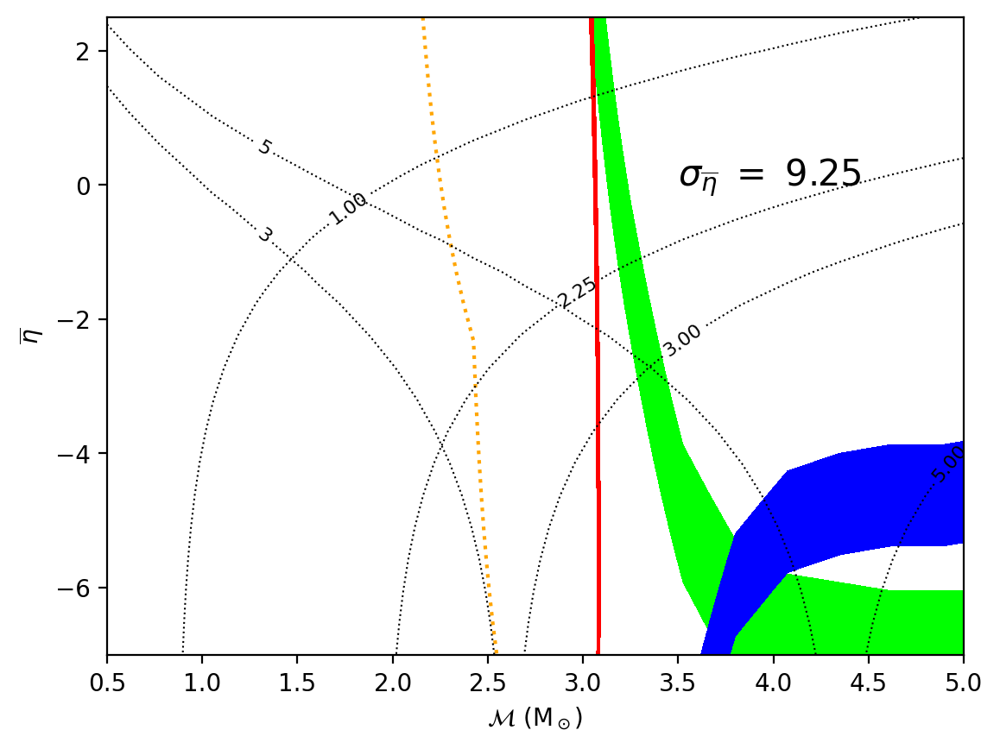

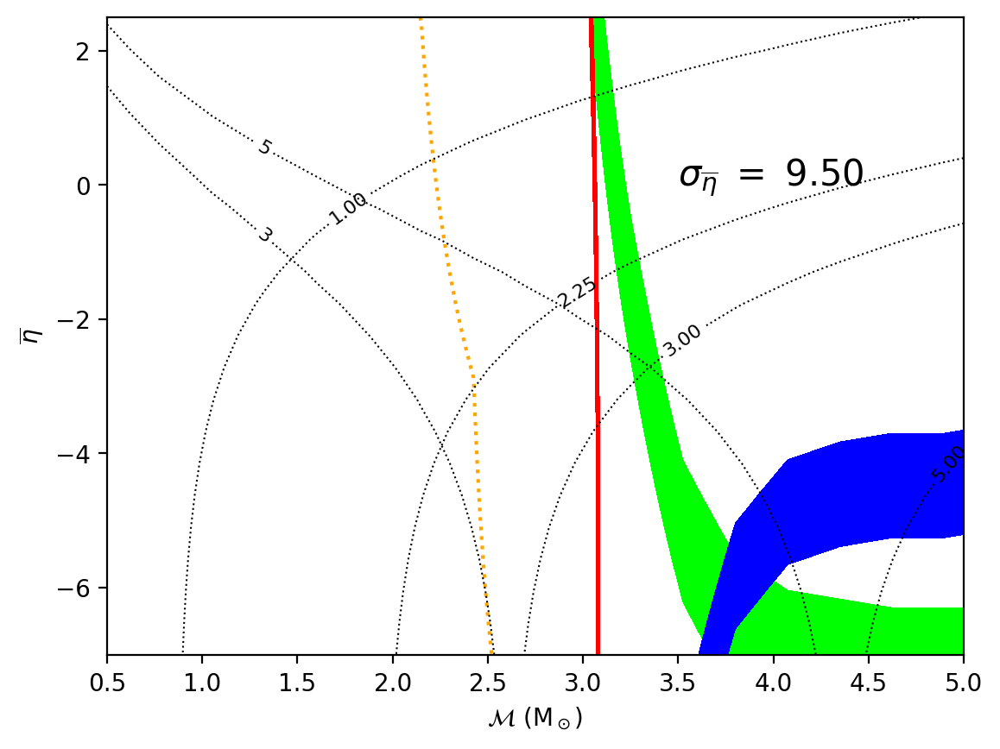

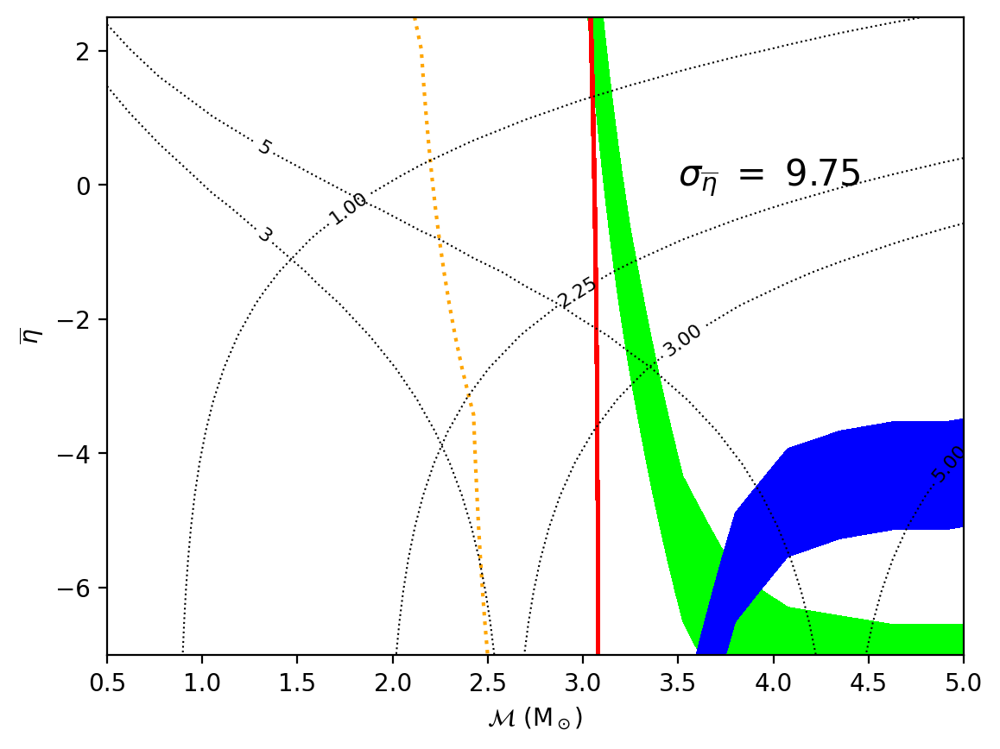

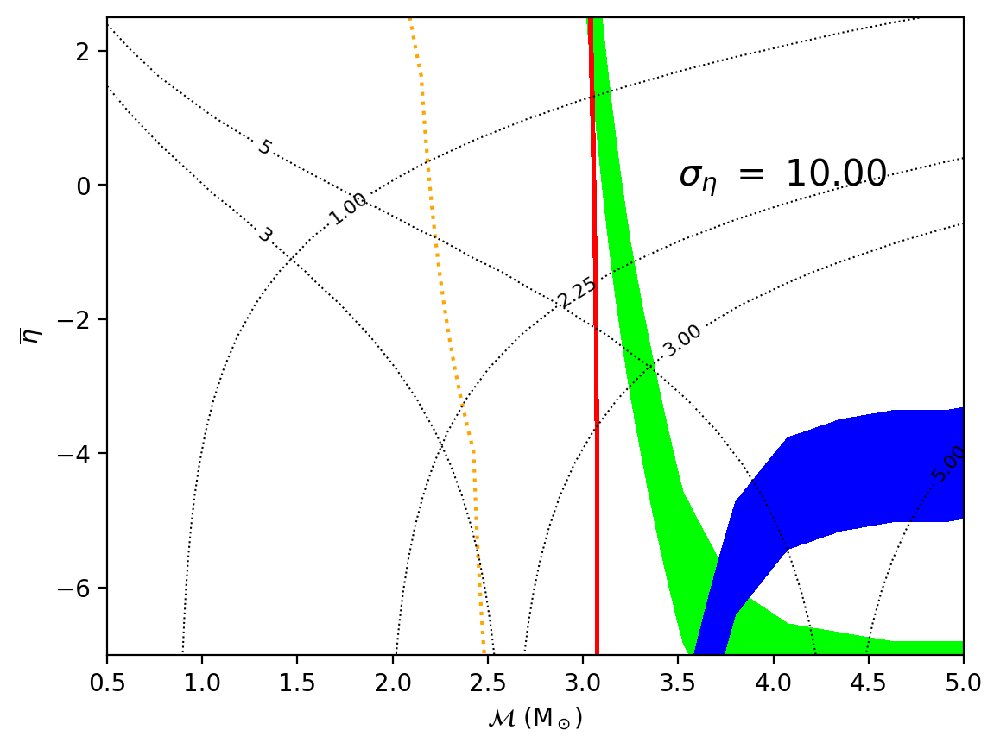

In [ ]:
# MERGER PROBABILITY CONTOUR PLOT IN MCH-ETA SPACE (LOG)

# method to create polygons of contours to calculate intersection of bands
def to_multipolygon(contour):
  if (contour is not None):
    polygons = list()
    for item in contour.collections:
      for i in item.get_paths():
        v = i.vertices
        x = v[:,0]
        y = v[:,1]
        polygons.append(Polygon([(i[0], i[1]) for i in zip(x,y)]))
    multipoly = so.unary_union(polygons)
    return multipoly

# loading chirp mass (e_mch) and mass ratio error (e_eta) data
e_eta_arr = original_df['e_eta'].drop_duplicates().to_numpy()
e_mch = 0.05

# loading data for the axes (chirp mass and eta_bar)
temp_df = original_df.loc[original_df['e_eta'] == 0.25]
mch_0 = temp_df["mch_0"].drop_duplicates().to_numpy()
eta_0 = temp_df["eta_0"].drop_duplicates().to_numpy()

# calculates m1 and m2 in terms of the axes
n = int(math.sqrt(len(temp_df)))
eta = 1./(4*(np.exp(eta_0)+1))
b = -(eta[:,np.newaxis]**(-0.6))*(mch_0)
c = (eta[:,np.newaxis]**(-0.2))*(mch_0**2)
m1 = -b/2  + np.sqrt(b**2 - 4*c)/2
m2 = -b/2 - np.sqrt(b**2 - 4*c)/2
# print(np.amax(m1),np.amin(m1))
# print(np.amax(m2),np.amin(m2))

# lists for figures and data
figs = []
mch_list, mch_max_list, mch_min_list = [], [], []
eta_bar_list, eta_bar_max_list, eta_bar_min_list = [], [], []
e_eta_intersection_list = []
intersection_list = []

# looping to create all plots for each e_eta data
for e_eta in e_eta_arr:

  # plot properties
  fig, ax = plt.subplots()
  fig.dpi = 200
  plt.ylabel(r"$\overline{\eta}$")
  plt.xlabel(r"$\mathcal{M}$ (M$_\odot$)")
  ax.set_ylim([-7,2.5])
  ax.set_xlim([0.5,5])

  # draws contours of m1 and m2
  mass1_contour = ax.contour(mch_0,eta_0,m1,[3,5],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass2_contour = ax.contour(mch_0,eta_0,m2,[1,2.25,3,5],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass1_contour.clabel(mass1_contour.levels,inline=True,fontsize=8)
  mass2_contour.clabel(mass2_contour.levels,inline=True,fontsize=8)

  # changing merger probability data format for contour
  df = original_df.loc[original_df['e_eta'] == e_eta]
  p_bns = np.empty([n,n])
  p_bhns = np.empty([n,n])
  p_gap = np.empty([n,n])
  p_bbh = np.empty([n,n])
  p_ns = np.empty([n,n])
  for i in range(n):
      p_bns[:][i] = df['p_bns'].loc[df['eta_0'] == eta_0[i]]
      p_bhns[:][i] = df['p_bhns'].loc[df['eta_0'] == eta_0[i]]
      p_gap[:][i] = df['p_gap'].loc[df['eta_0'] == eta_0[i]]
      p_bbh[:][i] = df['p_bbh'].loc[df['eta_0'] == eta_0[i]]
      p_ns[:][i] = df['p_ns'].loc[df['eta_0'] == eta_0[i]]

  # creates bands for each merger probability
  prob_bands = [
      (p_bns, candidate_p_bns, 'lime'),
      (p_bhns, candidate_p_bhns, 'red'),
      (p_gap, candidate_p_gap, 'blue'),
      (p_bbh, candidate_p_bbh, 'orange'),
      (p_ns, candidate_p_ns, 'purple')
    ]

  erase_area = []
  if (mass_outer_limit>0): erase_area.append(ax.contourf(mch_0, eta_0, m2, [0.0,mass_outer_limit], alpha=0))
  erase_area.append(ax.contourf(mch_0, eta_0, m2, [ns_mass_limit,5], alpha=0))

  polygons = []
  for p_values, candidate_prob, color in prob_bands:
    if candidate_prob < 0.025:
      if candidate_prob == 0: candidate_prob = 0.001
      contour = ax.contour(mch_0, eta_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    elif candidate_prob == 1:
      candidate_prob = 0.999
      contour = ax.contour(mch_0, eta_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    else:
      contour = ax.contourf(mch_0, eta_0, p_values, [candidate_prob - 0.025, candidate_prob + 0.025], colors=color)
      polygons.append(to_multipolygon(contour))
      intersection_length = len(polygons)

  # calculating intersection
  for i in range(intersection_length):
    for j in range(i+1,intersection_length):
      for k in range(j+1,intersection_length):
        p1 = polygons[i]
        p2 = polygons[j]
        p3 = polygons[k]
        if (p1 is not None and p2 is not None and p3 is not None):
          contour_intersect = shapely.intersection(p1,p2)

          if not contour_intersect.is_empty: contour_intersect = shapely.intersection(contour_intersect,p3)
          else: continue

          for area in erase_area:
            if not contour_intersect.is_empty: contour_intersect = contour_intersect.difference(to_multipolygon(area))
            else: break

          if not contour_intersect.is_empty:
            if (contour_intersect.geom_type == "MultiPolygon"):
              contour_intersect = shapely.concave_hull(contour_intersect)
            plt.fill_between(*contour_intersect.exterior.xy,hatch="/////")
            plt.plot(*contour_intersect.exterior.xy,color="black",linewidth=1)
            centroid = contour_intersect.centroid
            ellipse = mpl.patches.Ellipse([centroid.x,centroid.y], width=2*e_mch, height=2*e_eta,linewidth=0.75,linestyle='dashed',facecolor='none',edgecolor='black',zorder=20)
            ax.add_patch(ellipse)

            bounds = contour_intersect.bounds
            mch_list.append(centroid.x)
            mch_min_list.append(bounds[0])
            mch_max_list.append(bounds[2])
            eta_bar_list.append(centroid.y)
            eta_bar_min_list.append(bounds[1])
            eta_bar_max_list.append(bounds[3])
            e_eta_intersection_list.append(e_eta)
            intersection_list.append(contour_intersect)

  # appends figure to list of figures
  ax.text(3.5,0.0,r"$\sigma_{\overline{\eta}}$ $=$ " + str('{:.2f}'.format(e_eta)),fontsize=15) # label for error in eta
  figs.append(fig)

# saves figures in one pdf file
# p = PdfPages(url[-16:-4] + "_" + signal_name + ".pdf")
p = PdfPages(signal_name + ".pdf")
for fig in figs:
    fig.savefig(p, format='pdf')

/usr/local/lib/python3.10/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
<ipython-input-5-d41c73194198>:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


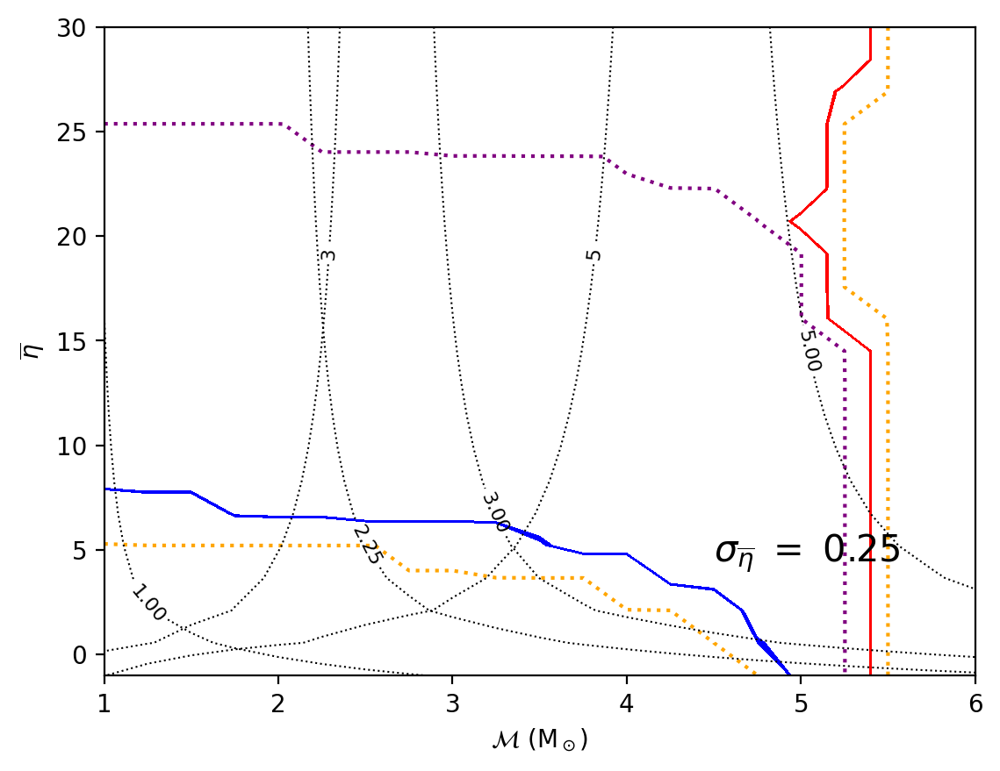

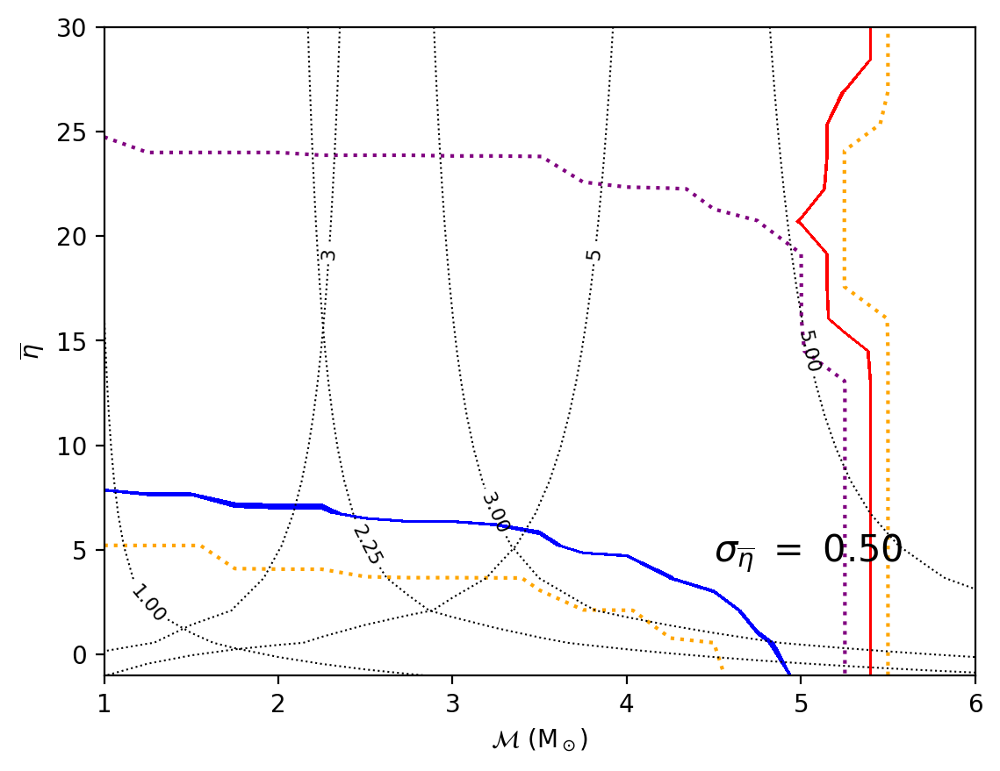

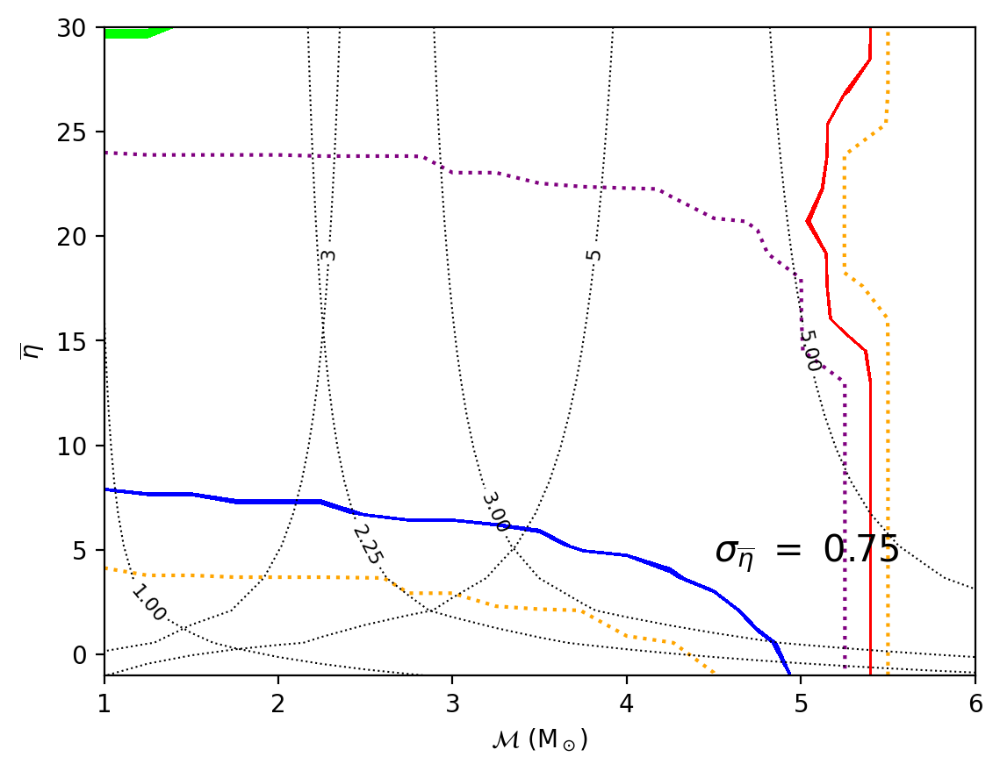

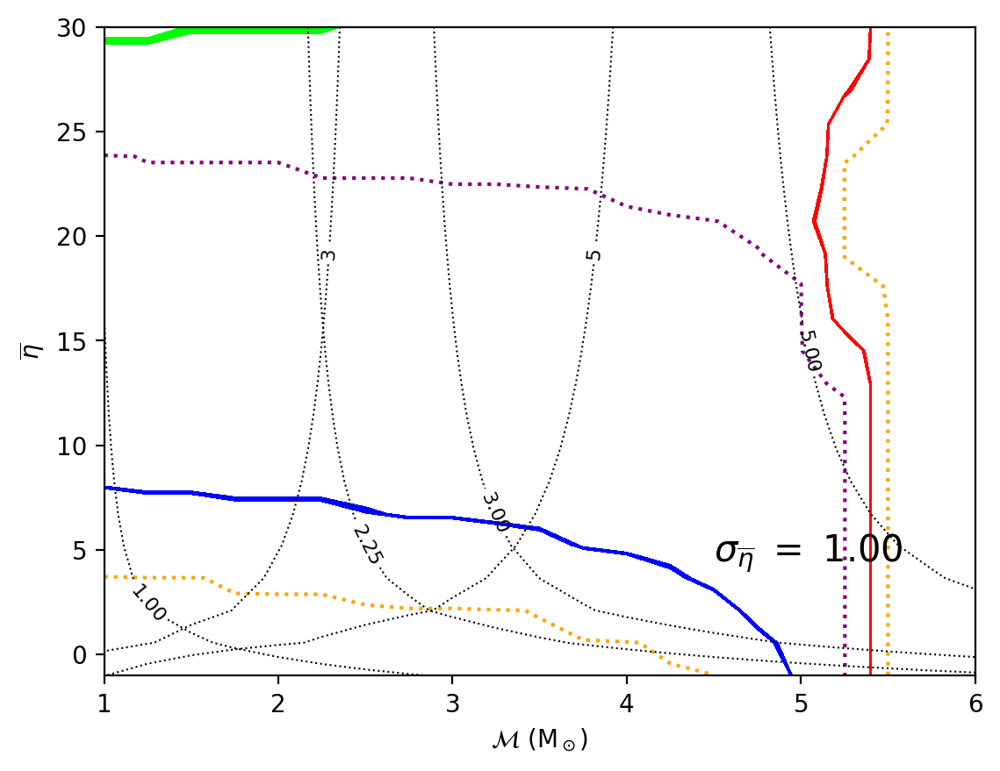

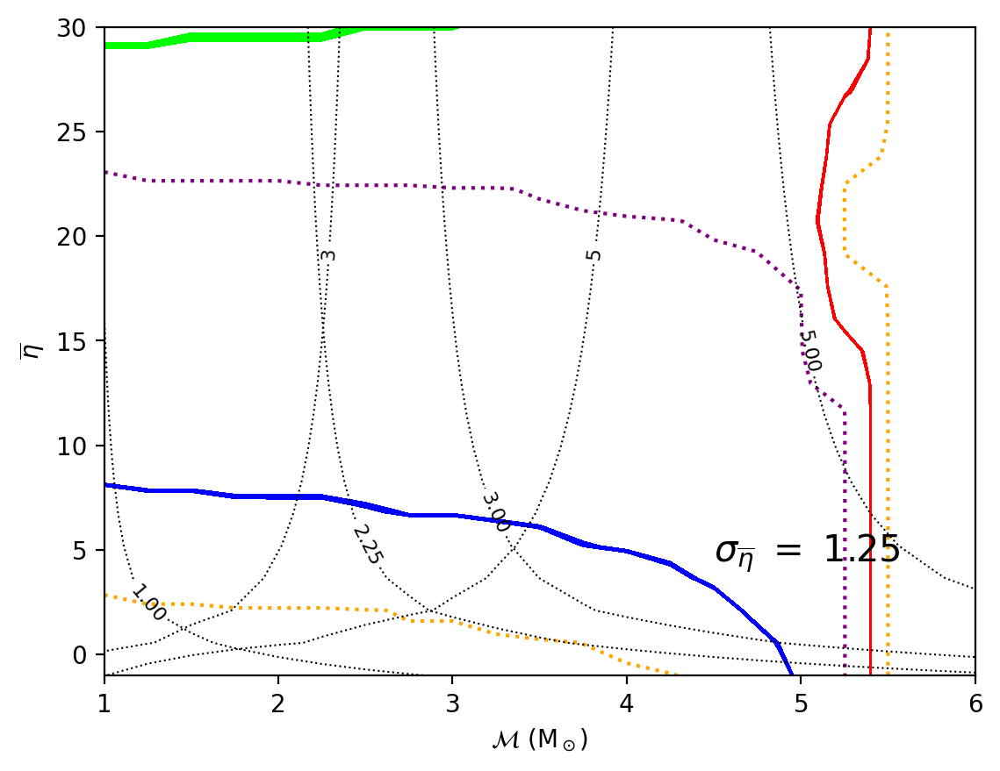

...

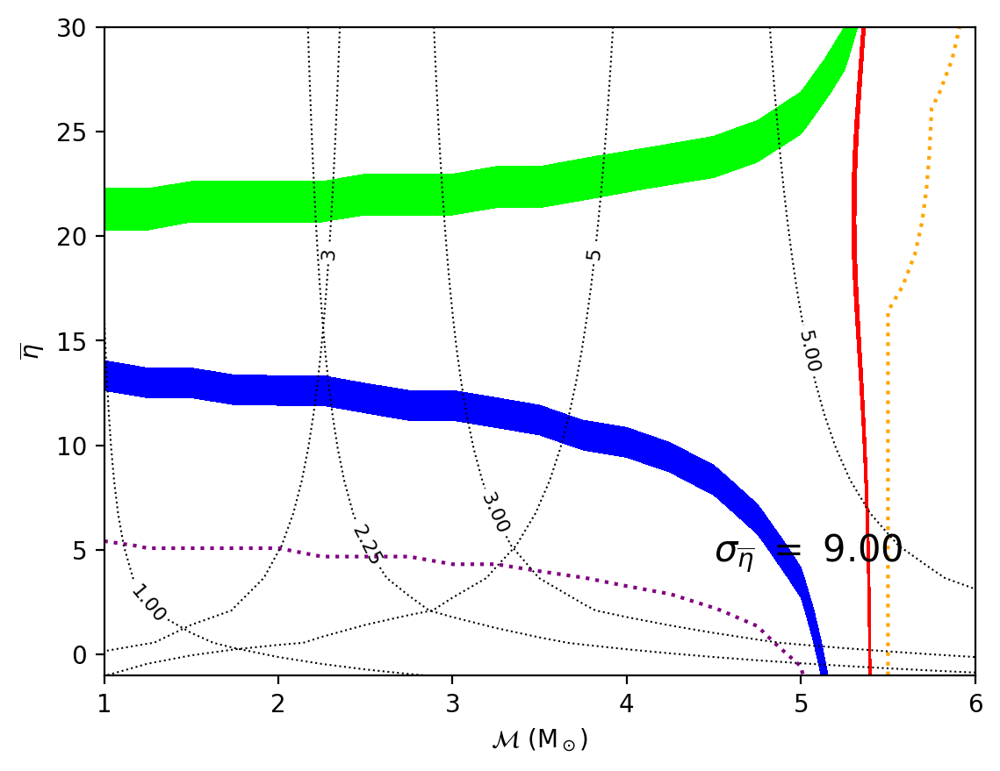

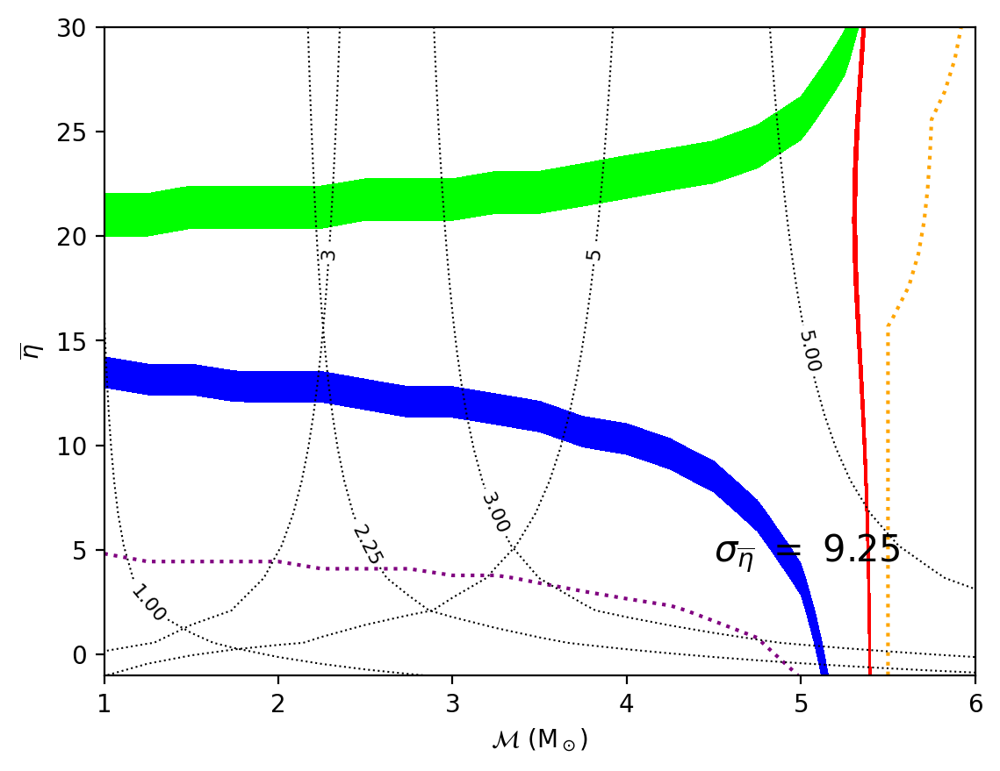

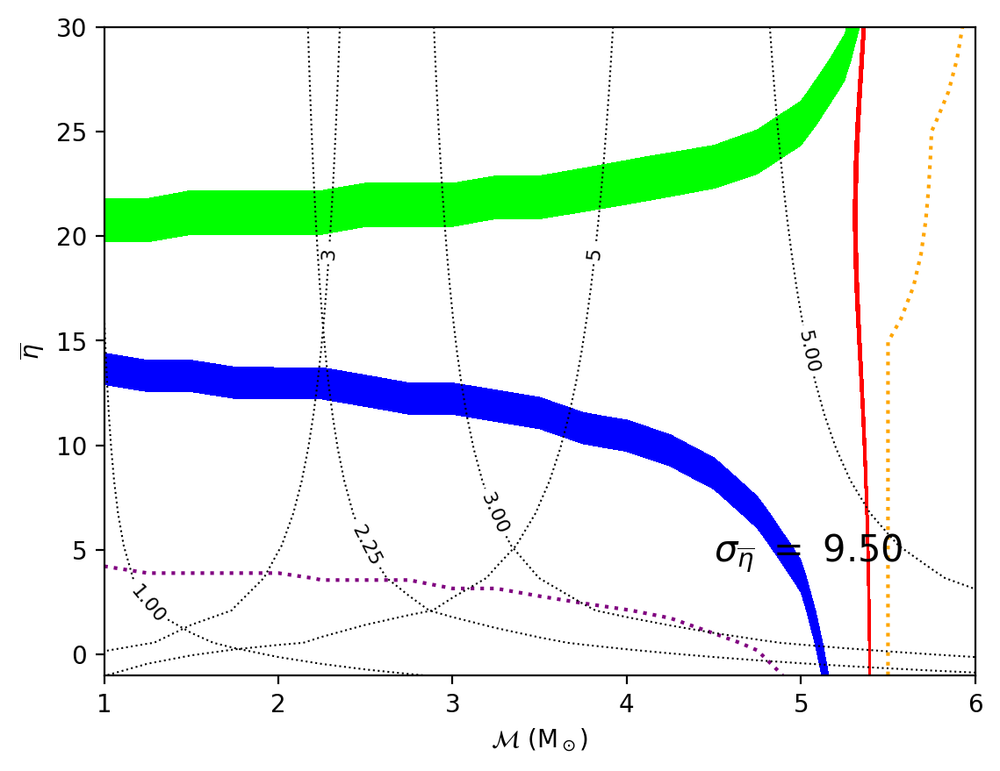

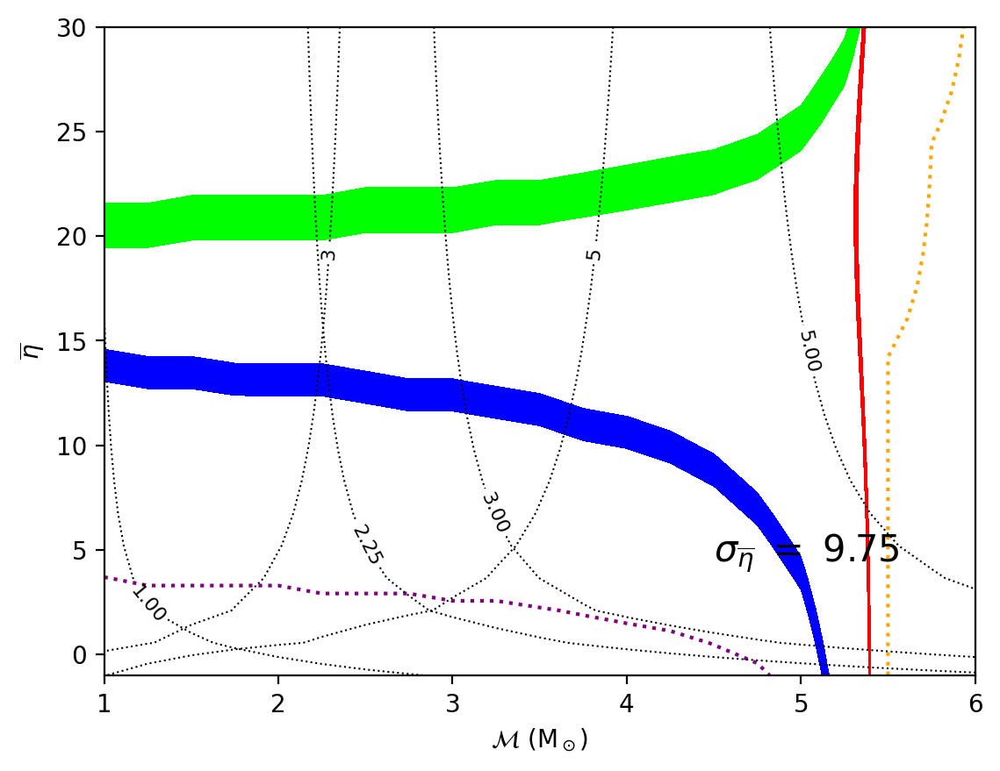

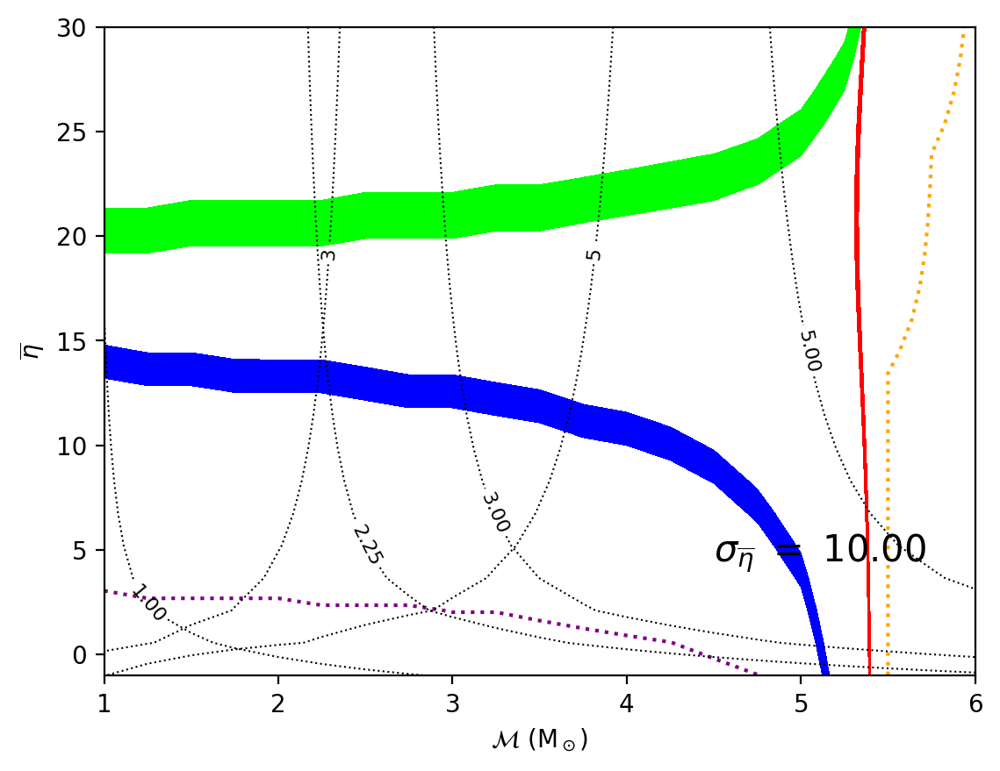

In [ ]:
# MERGER PROBABILITY CONTOUR PLOT IN MCH-ETA SPACE (TAN)

# method to create polygons of contours to calculate intersection of bands
def to_multipolygon(contour):
  if (contour is not None):
    polygons = list()
    for item in contour.collections:
      for i in item.get_paths():
        v = i.vertices
        x = v[:,0]
        y = v[:,1]
        polygons.append(Polygon([(i[0], i[1]) for i in zip(x,y)]))
    multipoly = so.unary_union(polygons)
    return multipoly

# loading chirp mass (e_mch) and mass ratio error (e_eta) data
e_eta_arr = original_df['e_eta'].drop_duplicates().to_numpy()
e_mch = 0.05

# loading data for the axes (chirp mass and eta_bar)
temp_df = original_df.loc[original_df['e_eta'] == 10.00]
mch_0 = temp_df["mch_0"].drop_duplicates().to_numpy()
eta_0 = temp_df["eta_0"].drop_duplicates().to_numpy()

# calculates m1 and m2 in terms of the axes
n = int(math.sqrt(len(temp_df)))
eta = (0.25/np.pi)*np.arctan(eta_0)+0.125
b = -(eta[:,np.newaxis]**(-0.6))*(mch_0)
c = (eta[:,np.newaxis]**(-0.2))*(mch_0**2)
m1 = -b/2  + np.sqrt(b**2 - 4*c)/2
m2 = -b/2 - np.sqrt(b**2 - 4*c)/2
# print(np.amax(m1),np.amin(m1))
# print(np.amax(m2),np.amin(m2))

# lists for figures and data
figs = []
mch_list, mch_max_list, mch_min_list = [], [], []
eta_bar_list, eta_bar_max_list, eta_bar_min_list = [], [], []
e_eta_intersection_list = []
intersection_list = []

# looping to create all plots for each e_eta data
for e_eta in e_eta_arr:

  # plot properties
  fig, ax = plt.subplots()
  fig.dpi = 200
  plt.ylabel(r"$\overline{\eta}$")
  plt.xlabel(r"$\mathcal{M}$ (M$_\odot$)")
  ax.set_ylim([-1,30])
  ax.set_xlim([1,6])

  # draws contours of m1 and m2
  mass1_contour = ax.contour(mch_0,eta_0,m1,[3,5],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass2_contour = ax.contour(mch_0,eta_0,m2,[1,2.25,3,5],linestyles='dotted',colors='black',linewidths=0.75,zorder=20)
  mass1_contour.clabel(mass1_contour.levels,inline=True,fontsize=8)
  mass2_contour.clabel(mass2_contour.levels,inline=True,fontsize=8)

  # changing merger probability data format for contour
  df = original_df.loc[original_df['e_eta'] == e_eta]
  p_bns = np.empty([n,n])
  p_bhns = np.empty([n,n])
  p_gap = np.empty([n,n])
  p_bbh = np.empty([n,n])
  p_ns = np.empty([n,n])
  for i in range(n):
      p_bns[:][i] = df['p_bns'].loc[df['eta_0'] == eta_0[i]]
      p_bhns[:][i] = df['p_bhns'].loc[df['eta_0'] == eta_0[i]]
      p_gap[:][i] = df['p_gap'].loc[df['eta_0'] == eta_0[i]]
      p_bbh[:][i] = df['p_bbh'].loc[df['eta_0'] == eta_0[i]]
      p_ns[:][i] = df['p_ns'].loc[df['eta_0'] == eta_0[i]]

  # creates bands for each merger probability
  prob_bands = [
      (p_bns, candidate_p_bns, 'lime'),
      (p_bhns, candidate_p_bhns, 'red'),
      (p_gap, candidate_p_gap, 'blue'),
      (p_bbh, candidate_p_bbh, 'orange'),
      (p_ns, candidate_p_ns, 'purple')
    ]

  erase_area = []
  # if (mass_outer_limit>0): erase_area.append(ax.contourf(mch_0, eta_0, m2, [0.0,mass_outer_limit], alpha=0))
  # erase_area.append(ax.contourf(mch_0, eta_0, m2, [ns_mass_limit,5], alpha=0))

  polygons = []
  for p_values, candidate_prob, color in prob_bands:
    if candidate_prob < 0.025:
      if candidate_prob == 0: candidate_prob = 0.001
      contour = ax.contour(mch_0, eta_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    elif candidate_prob == 1:
      candidate_prob = 0.999
      contour = ax.contour(mch_0, eta_0, p_values, [candidate_prob], colors=color, linestyles='dotted')
    else:
      contour = ax.contourf(mch_0, eta_0, p_values, [candidate_prob - 0.025, candidate_prob + 0.025], colors=color)
      polygons.append(to_multipolygon(contour))
      intersection_length = len(polygons)

  # calculating intersection
  for i in range(intersection_length):
    for j in range(i+1,intersection_length):
      for k in range(j+1,intersection_length):
        p1 = polygons[i]
        p2 = polygons[j]
        p3 = polygons[k]
        if (p1 is not None and p2 is not None and p3 is not None):
          contour_intersect = shapely.intersection(p1,p2)

          if not contour_intersect.is_empty: contour_intersect = shapely.intersection(contour_intersect,p3)
          else: continue

          for area in erase_area:
            if not contour_intersect.is_empty: contour_intersect = contour_intersect.difference(to_multipolygon(area))
            else: break

          if not contour_intersect.is_empty:
            if (contour_intersect.geom_type == "MultiPolygon"):
              contour_intersect = shapely.concave_hull(contour_intersect)
            plt.fill_between(*contour_intersect.exterior.xy,hatch="/////")
            plt.plot(*contour_intersect.exterior.xy,color="black",linewidth=1)
            centroid = contour_intersect.centroid
            ellipse = mpl.patches.Ellipse([centroid.x,centroid.y], width=2*e_mch, height=2*e_eta,linewidth=0.75,linestyle='dashed',facecolor='none',edgecolor='black',zorder=20)
            ax.add_patch(ellipse)

            bounds = contour_intersect.bounds
            mch_list.append(centroid.x)
            mch_min_list.append(bounds[0])
            mch_max_list.append(bounds[2])
            eta_bar_list.append(centroid.y)
            eta_bar_min_list.append(bounds[1])
            eta_bar_max_list.append(bounds[3])
            e_eta_intersection_list.append(e_eta)
            intersection_list.append(contour_intersect)

  # appends figure to list of figures
  ax.text(4.5,4.5,r"$\sigma_{\overline{\eta}}$ $=$ " + str('{:.2f}'.format(e_eta)),fontsize=15) # label for error in eta
  figs.append(fig)

# saves figures in one pdf file
p = PdfPages(url[-16:-4] + "_" + signal_name + ".pdf")
# p = PdfPages(signal_name + ".pdf")
for fig in figs:
    fig.savefig(p, format='pdf')